<a href="https://colab.research.google.com/github/brendaFlavia/Computer-vision-project/blob/main/Task_Two.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import torch
import cv2
import os
from IPython.display import Image

In [ ]:
!pip install tensorboard

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


Clone the git repository for Yolov5

In [ ]:
!git clone https://github.com/ultralytics/yolov5

Cloning into 'yolov5'...
remote: Enumerating objects: 13687, done.
remote: Counting objects: 100% (489/489), done.
remote: Compressing objects: 100% (178/178), done.
remote: Total 13687 (delta 354), reused 436 (delta 311), pack-reused 13198
Receiving objects: 100% (13687/13687), 13.28 MiB | 13.23 MiB/s, done.
Resolving deltas: 100% (9418/9418), done.


Enter into Yolov5 Directory

In [ ]:
%cd yolov5

/content/yolov5


Install Roboflow and import project 

In [ ]:
!pip install roboflow

from roboflow import Roboflow
rf = Roboflow(api_key="uAdk3DElNz0nWTwG96oc")
project = rf.workspace("computer-vision-iwlzu").project("comp.vision")
dataset = project.version(1).download("yolov5")

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 145 kB 6.7 MB/s 
     |████████████████████████████████| 178 kB 57.6 MB/s 
     |████████████████████████████████| 1.1 MB 60.0 MB/s 
     |████████████████████████████████| 67 kB 7.0 MB/s 
     |████████████████████████████████| 54 kB 3.2 MB/s 
     |████████████████████████████████| 138 kB 71.2 MB/s 
     |████████████████████████████████| 62 kB 1.4 MB/s 
  Created wheel for roboflow: filename=roboflow-0.2.15-py3-none-any.whl size=24936 sha256=0e89e1af614dd9ea6897073b09bae8b2b70bdf4e71e7e180fa28fd0bac7483df
  Stored in directory: /root/.cache/pip/wheels/13/e0/a3/fe183fffc3972cb9264e800763d4bbfff80d5309137c410217
  Created wheel for wget: filename=wget-3.2-py3-none-any.whl size=9675 sha256=1a9e63280e80429d20d2e84079363c91d1d07b74f4ed5d5a783d991c5129ff9d
  Stored in directory: /root/.cache/pip/wheels/a1/b6/7c/0e63e34eb06634181c63adacca38b79ff8f35c37e

loading Roboflow workspace...
loading Roboflow project...


Extracting Dataset Version Zip to Comp.Vision-1 in yolov5pytorch:: 100%|██████████| 1178/1178 [00:00<00:00, 2129.61it/s]


In [ ]:
train='/content/yolov5/Comp.Vision-1/train/images'

In [ ]:
!python train.py --img 415 --batch 16 --epochs 40 --data '/content/yolov5/Comp.Vision-1/data.yaml' --weights yolov5s.pt --cache

train: weights=yolov5s.pt, cfg=, data=/content/yolov5/Comp.Vision-1/data.yaml, hyp=data/hyps/hyp.scratch-low.yaml, epochs=40, batch_size=16, imgsz=415, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, bucket=, cache=ram, image_weights=False, device=, multi_scale=False, single_cls=False, optimizer=SGD, sync_bn=False, workers=8, project=runs/train, name=exp, exist_ok=False, quad=False, cos_lr=False, label_smoothing=0.0, patience=100, freeze=[0], save_period=-1, seed=0, local_rank=-1, entity=None, upload_dataset=False, bbox_interval=-1, artifact_alias=latest
github: up to date with https://github.com/ultralytics/yolov5 ✅
requirements: YOLOv5 requirements "ipython" "thop>=0.1.1" not found, attempting AutoUpdate...
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/

requirements: 2 packages updated per /content/yolov5/requirements.txt
requirements: ⚠️ Restart runtime or rerun command for upda

View Results( Graphs for losses, precision, recall)

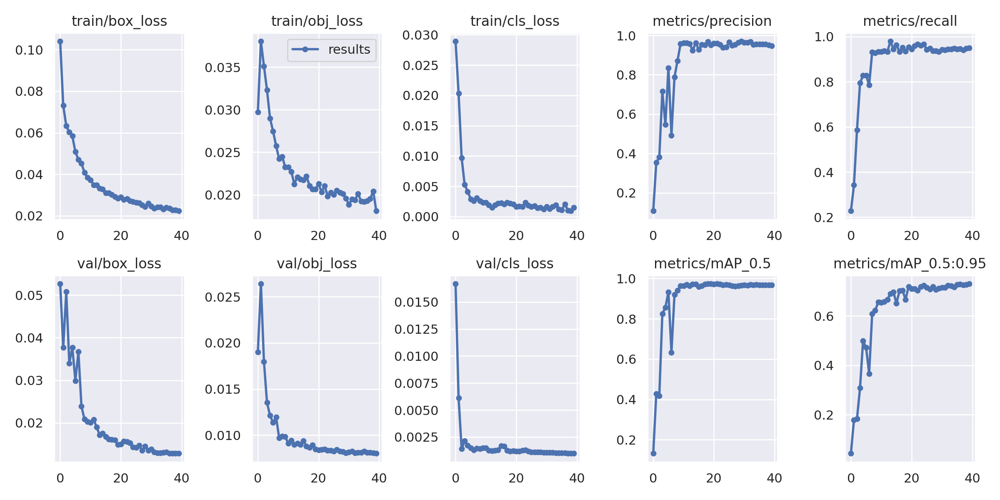

In [ ]:
Image(filename = '/content/yolov5/runs/train/exp/results.png', width =1000)

View Confusion Matrix

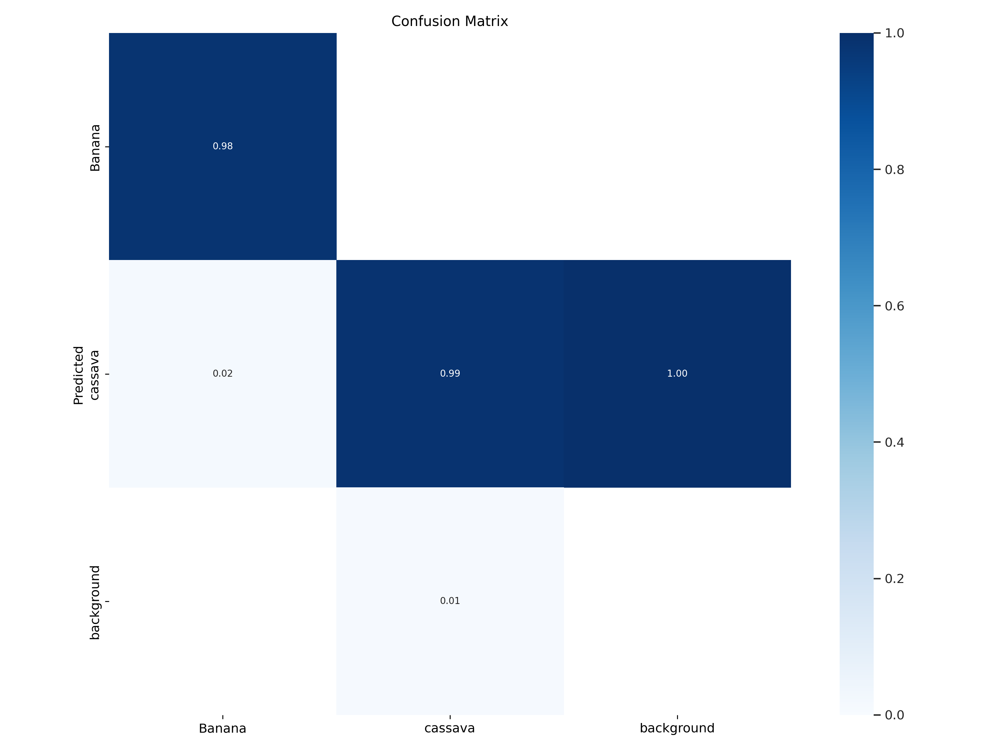

In [ ]:
Image(filename = '/content/yolov5/runs/train/exp/confusion_matrix.png', width =1000)

View train images with labels

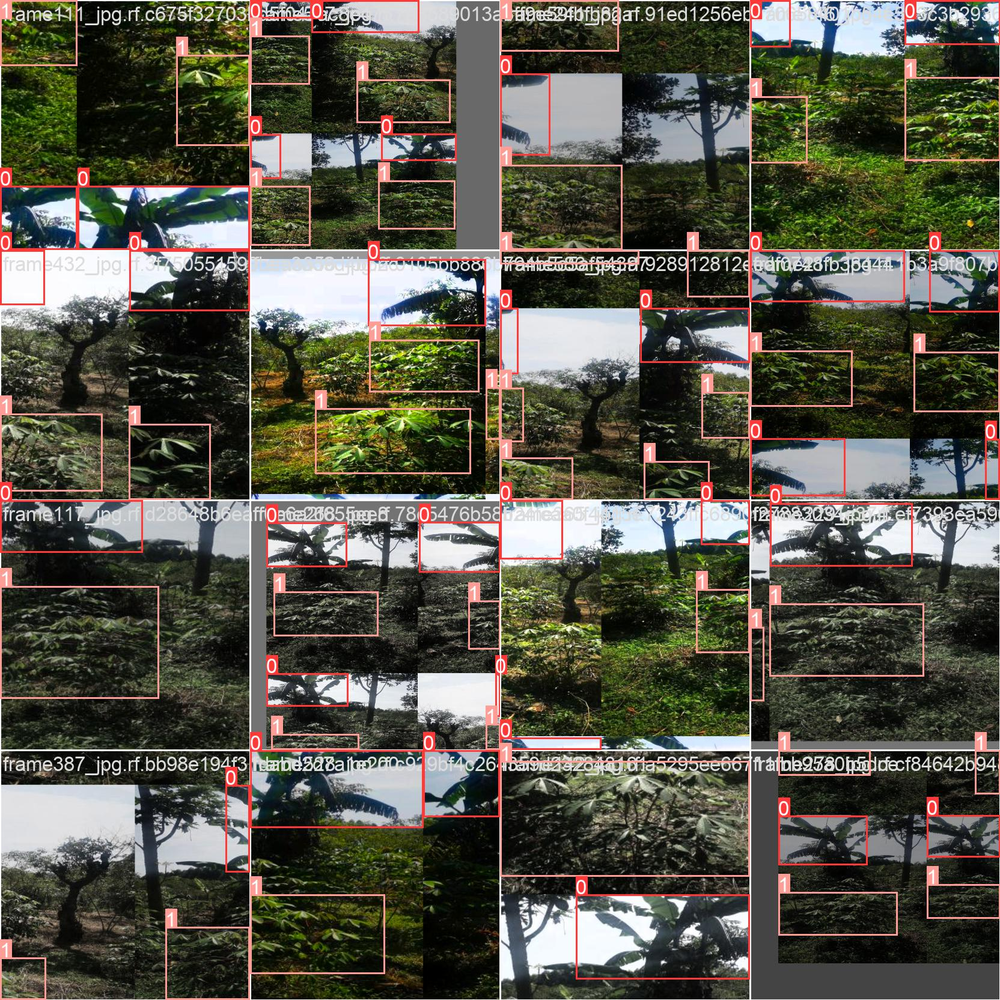

In [ ]:
Image(filename = '/content/yolov5/runs/train/exp/train_batch2.jpg', width =1000)

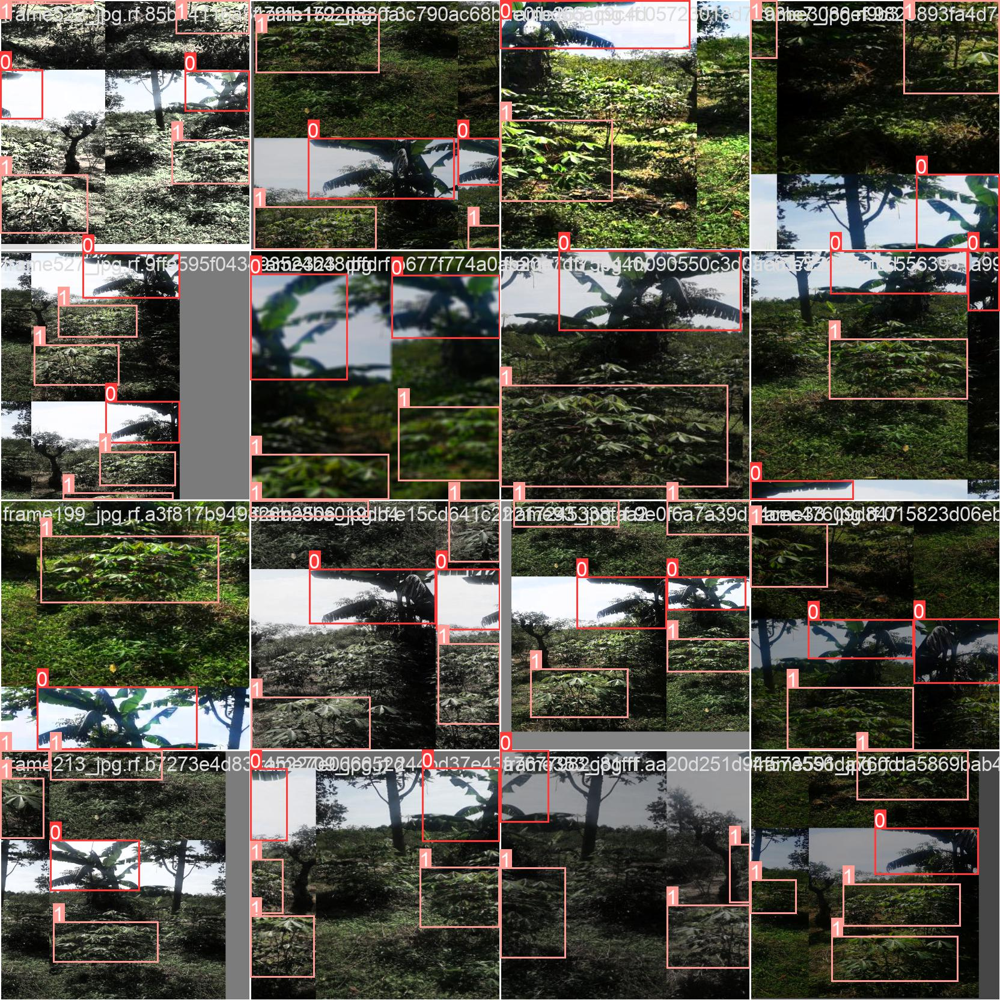

In [ ]:
Image(filename = '/content/yolov5/runs/train/exp/train_batch1.jpg', width =1000)

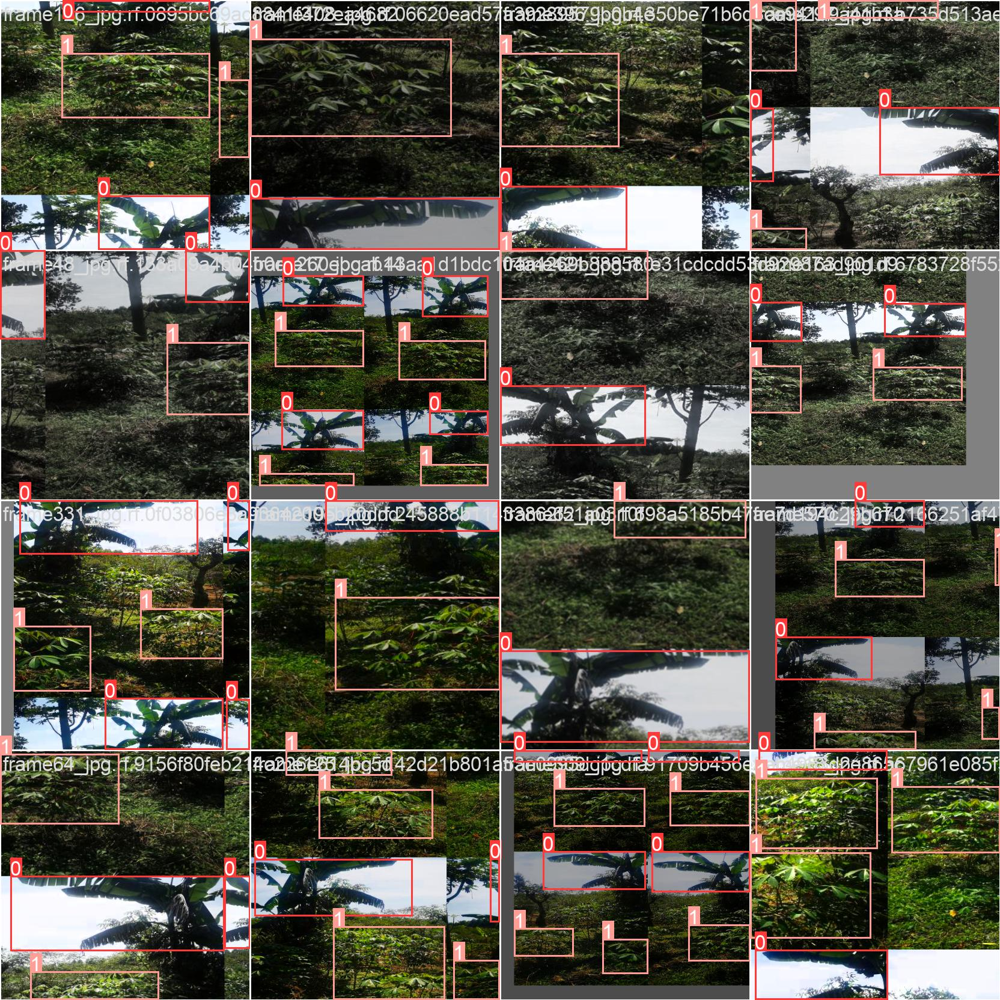

In [ ]:
Image(filename = '/content/yolov5/runs/train/exp/train_batch0.jpg', width =1000)

Visualize the results from Validation batch

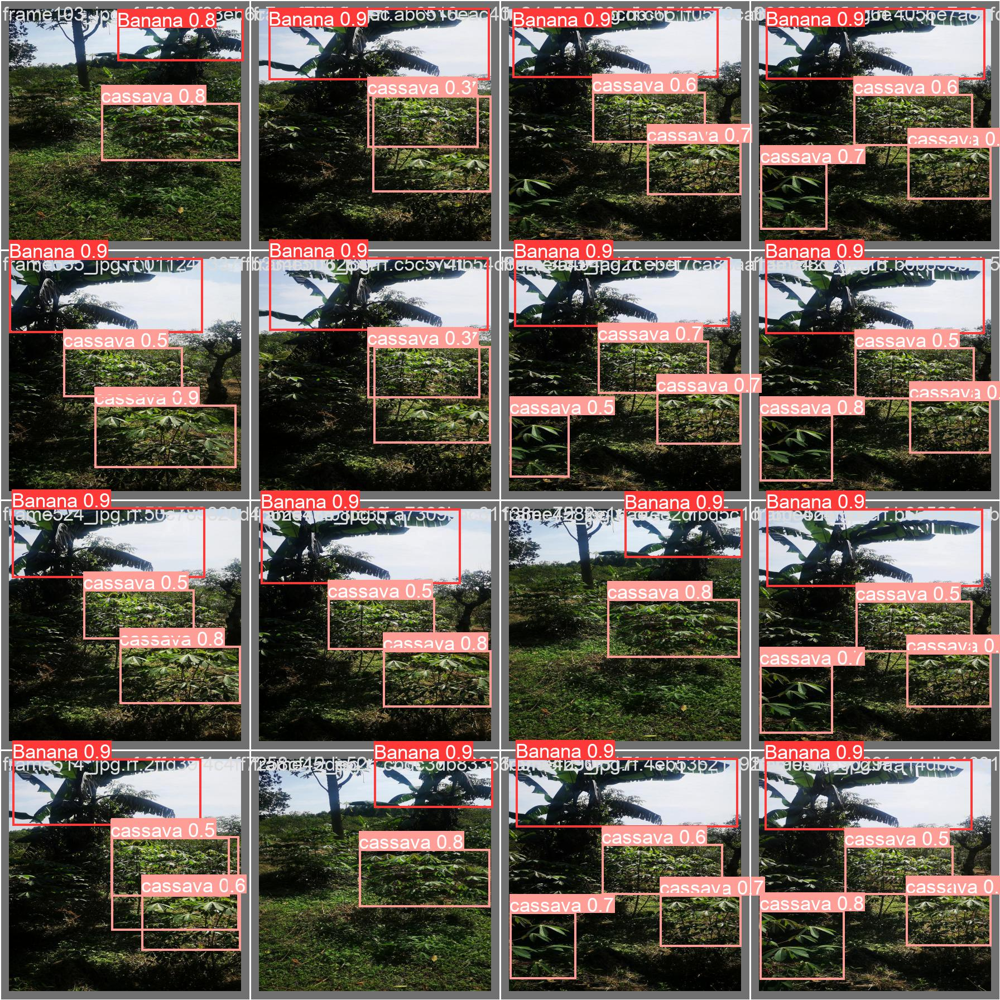

In [ ]:
Image(filename = '/content/yolov5/runs/train/exp/val_batch0_pred.jpg', width =1000)

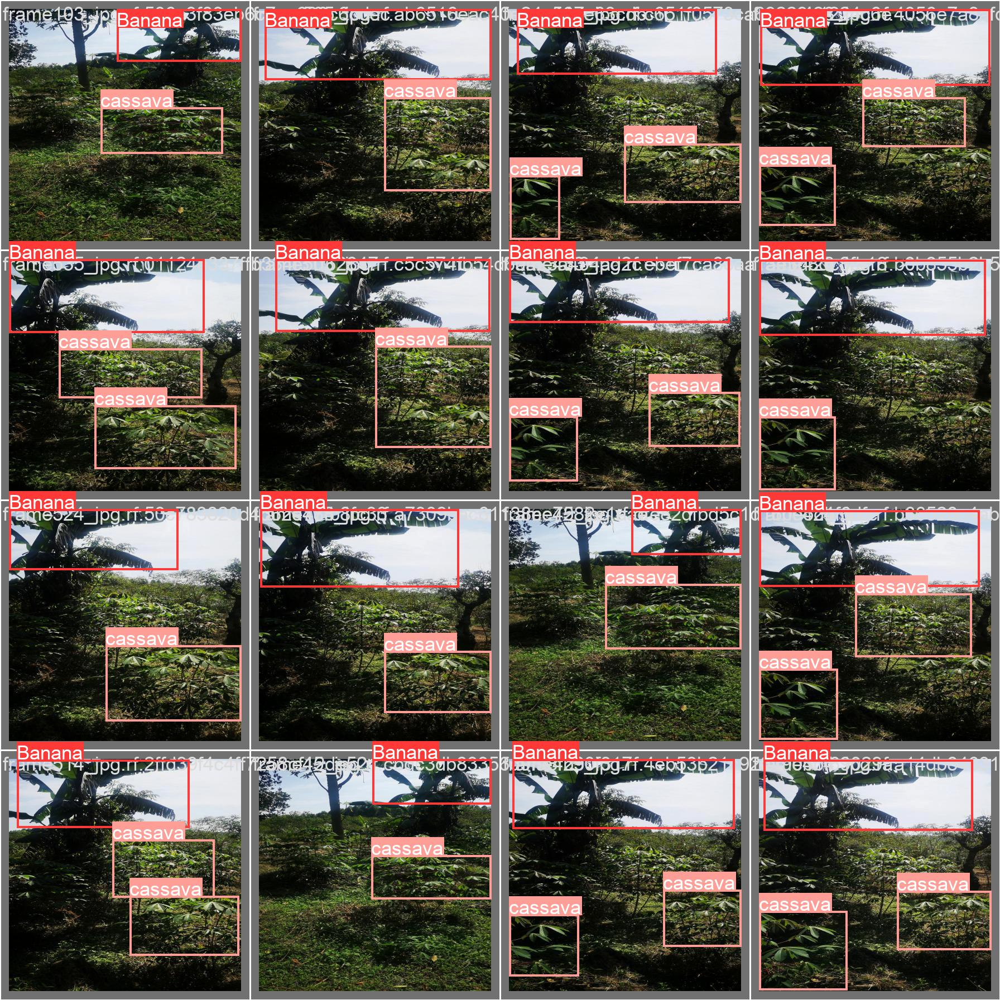

In [ ]:
Image(filename = '/content/yolov5/runs/train/exp/val_batch0_labels.jpg', width =1000)

Install tensorboard to visualize the results

In [ ]:
%load_ext tensorboard
%tensorboard --logdir runs

<IPython.core.display.Javascript object>

In [ ]:
#test the model with a test image

!python detect.py --source '/content/yolov5/Comp.Vision-1/test/images/frame217_jpg.rf.b33855aca489df124a77a5c194dcd426.jpg' --weights '/content/yolov5/runs/train/exp/weights/best.pt'

detect: weights=['/content/yolov5/runs/train/exp/weights/best.pt'], source=/content/yolov5/Comp.Vision-1/test/images/frame217_jpg.rf.b33855aca489df124a77a5c194dcd426.jpg, data=data/coco128.yaml, imgsz=[640, 640], conf_thres=0.25, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v6.2-187-g5ef69ef Python-3.7.14 torch-1.12.1+cu113 CUDA:0 (Tesla T4, 15110MiB)

Fusing layers... 
Model summary: 157 layers, 7015519 parameters, 0 gradients, 15.8 GFLOPs
image 1/1 /content/yolov5/Comp.Vision-1/test/images/frame217_jpg.rf.b33855aca489df124a77a5c194dcd426.jpg: 640x640 1 Banana, 1 cassava, 12.7ms
Speed: 0.5ms pre-process, 12.7ms inference, 1.3ms NMS per image at shape (1, 3, 640, 640)
Results saved to runs/d

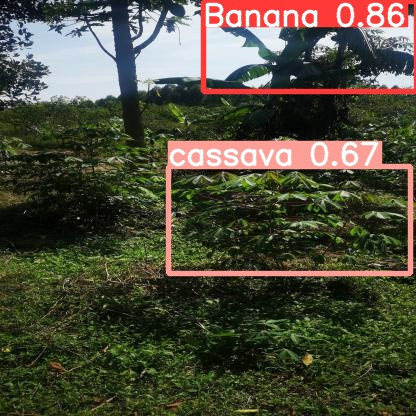

In [ ]:
#view the test prediction
Image(filename = '/content/yolov5/runs/detect/exp/frame100_jpg.rf.00c55ddcfeb86c6cfb372de7d1b490db.jpg', width =1000)

In [ ]:
!python detect.py --source '/content/yolov5/Comp.Vision-1/test/images/frame100_jpg.rf.00c55ddcfeb86c6cfb372de7d1b490db.jpg' --weights '/content/yolov5/runs/train/exp/weights/best.pt'

detect: weights=['/content/yolov5/runs/train/exp/weights/best.pt'], source=/content/yolov5/Comp.Vision-1/test/images/frame100_jpg.rf.00c55ddcfeb86c6cfb372de7d1b490db.jpg, data=data/coco128.yaml, imgsz=[640, 640], conf_thres=0.25, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v6.2-187-g5ef69ef Python-3.7.14 torch-1.12.1+cu113 CUDA:0 (Tesla T4, 15110MiB)

Fusing layers... 
Model summary: 157 layers, 7015519 parameters, 0 gradients, 15.8 GFLOPs
image 1/1 /content/yolov5/Comp.Vision-1/test/images/frame100_jpg.rf.00c55ddcfeb86c6cfb372de7d1b490db.jpg: 640x640 1 Banana, 1 cassava, 12.7ms
Speed: 0.5ms pre-process, 12.7ms inference, 1.4ms NMS per image at shape (1, 3, 640, 640)
Results saved to runs/d

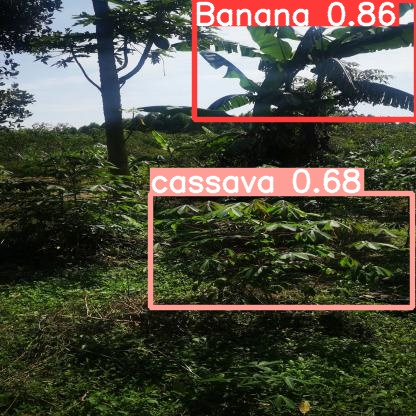

In [ ]:
#view the predicted image
Image(filename = '/content/yolov5/runs/detect/exp2/frame217_jpg.rf.b33855aca489df124a77a5c194dcd426.jpg', width =1000)

In [ ]:
#test the model with test images
!python detect.py --source '/content/yolov5/Comp.Vision-1/test/images/frame420_jpg.rf.42755a2e2776681772be8742ea5e61ff.jpg' --weights '/content/yolov5/runs/train/exp/weights/best.pt'

detect: weights=['/content/yolov5/runs/train/exp/weights/best.pt'], source=/content/yolov5/Comp.Vision-1/test/images/frame420_jpg.rf.42755a2e2776681772be8742ea5e61ff.jpg, data=data/coco128.yaml, imgsz=[640, 640], conf_thres=0.25, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v6.2-187-g5ef69ef Python-3.7.14 torch-1.12.1+cu113 CUDA:0 (Tesla T4, 15110MiB)

Fusing layers... 
Model summary: 157 layers, 7015519 parameters, 0 gradients, 15.8 GFLOPs
image 1/1 /content/yolov5/Comp.Vision-1/test/images/frame420_jpg.rf.42755a2e2776681772be8742ea5e61ff.jpg: 640x640 1 Banana, 2 cassavas, 12.7ms
Speed: 0.6ms pre-process, 12.7ms inference, 1.2ms NMS per image at shape (1, 3, 640, 640)
Results saved to runs/

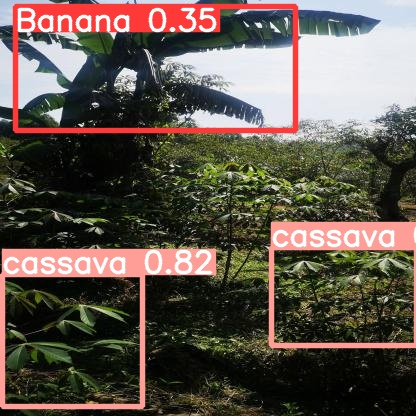

In [ ]:
#View the resultant image after prediction
Image(filename = '/content/yolov5/runs/detect/exp3/frame420_jpg.rf.42755a2e2776681772be8742ea5e61ff.jpg', width =1000)